In [1]:
import pandas as pd
import h3pandas
import glob

apt = 'LSZH'

In [51]:
df = pd.read_csv('https://davidmegginson.github.io/ourairports-data/airports.csv')
apt_info = df[df.ident==apt]

# Use glob to list all files that match the wildcard pattern
files = glob.glob(f'data/{apt}_2023-05-01-*.parquet')


# Read each file in the list into a pandas DataFrame and store them in a list
dfs = [pd.read_parquet(file) for file in files]

# Concatenate all the DataFrames in the list into a single DataFrame
df_essa = pd.concat(dfs, ignore_index=True)

In [52]:
# Read apron data
apron = pd.read_parquet(f'data/apron_hex_bu/h3_res_12_apron_{apt}.parquet')

def flight_level_to_metres(flight_level):
    """
    Convert a Flight Level to metres.

    A Flight Level is a standard nominal altitude of an aircraft, in hundreds of feet.
    This function converts it to metres using the conversion 1 foot = 0.3048 metres.

    Args:
        flight_level (int): The Flight Level to convert.

    Returns:
        int: The altitude in metres.

    Example:
        flight_level_to_metres(350) returns 10668 for FL350 (35,000 feet).
    """
    feet_per_flight_level = 100
    metres_per_foot = 0.3048
    return int(flight_level * feet_per_flight_level * metres_per_foot)

# Filter our only ground based flights
flight_level = 30  # FL350
altitude_in_metres = flight_level_to_metres(flight_level)
df_essa = df_essa[df_essa['baroaltitude'] < altitude_in_metres]

# Add hex id res 12
df_essa = df_essa.h3.geo_to_h3(resolution = 12, lat_col = 'lat', lng_col = 'lon').reset_index()

apron = apron[['hex_id', 'aeroway', 'id', 'ref']]
apron.columns = ['apron_' + x for x in apron.columns]
apron['apron_ref'] = apron['apron_ref'].fillna('')

# Add link to the element in question
apron['apron_id_link'] = 'https://www.openstreetmap.org/way/' + apron['apron_id'].astype(str).fillna('')

# Add apron info
df_essa_apron = df_essa.merge(apron, left_on = 'h3_12', right_on='apron_hex_id')

In [53]:
df_essa_apron['id'] = df_essa_apron['icao24'] + '_' + df_essa_apron['callsign']

In [54]:
# Ensure the DataFrame is sorted
df_essa_apron.sort_values(by=['id', 'time'], inplace=True)

In [55]:
# Convert time column to datetime if it's not already
df_essa_apron['time'] = pd.to_datetime(df_essa_apron['time'])

# Function to assign track IDs within each group
def assign_track_ids(group):
    # Sort group just in case
    group = group.sort_values(by='time')
    
    # Calculate the time difference between each row and the next
    group['time_diff'] = group['time'].diff().dt.total_seconds().fillna(0)
    
    # Identify rows where a new track starts
    group['new_track'] = (group['time_diff'] > (5 * 60)) # Assuming a new track if the gap is more than 5 minutes
    
    # Cumulative sum to assign a new ID each time 'new_track' is True
    group['track_id'] = group['new_track'].cumsum()
    
    return group

In [56]:
# Apply the function to each group of 'id' and 'apron_id'
df_essa_apron = df_essa_apron.groupby(['id', 'apron_id']).apply(assign_track_ids)

/tmp/ipykernel_419/3228977985.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [57]:
tmp = df_essa_apron.copy()

In [58]:
# Optional: drop the intermediate columns if they are no longer needed
tmp.drop(columns=['time_diff', 'new_track', 'apron_id', 'id'], inplace=True)

In [59]:
tmp = tmp.reset_index()

In [60]:


# Groupby
df_essa_apron = tmp.groupby(['icao24', 'callsign', 'apron_id', 'apron_id_link', 'apron_aeroway','apron_ref', 'track_id'])['time'].agg(["min", "max"]).reset_index()

In [61]:
df_essa_apron

,icao24,callsign,apron_id,apron_id_link,apron_aeroway,apron_ref,track_id,min,max
0,040197,ETH736,4386418,https://www.openstreetmap.org/way/4386418,runway,10/28,0,2023-05-01 06:58:51+00:00,2023-05-01 06:58:54+00:00
1,040197,ETH736,4386419,https://www.openstreetmap.org/way/4386419,runway,16/34,0,2023-05-01 06:58:35+00:00,2023-05-01 06:59:55+00:00
2,040197,ETH736,29024446,https://www.openstreetmap.org/way/29024446,taxiway,B,0,2023-05-01 06:58:55+00:00,2023-05-01 06:58:55+00:00
3,040197,ETH736,38080880,https://www.openstreetmap.org/way/38080880,taxiway,E9,0,2023-05-01 06:58:29+00:00,2023-05-01 06:58:30+00:00
4,040197,ETH736,109360768,https://www.openstreetmap.org/way/109360768,taxiway,Link 6,0,2023-05-01 07:02:36+00:00,2023-05-01 07:02:54+00:00
...,...,...,...,...,...,...,...,...,...
26993,c0171a,ACA881,1103102476,https://www.openstreetmap.org/way/1103102476,taxiway,E3,1,2023-05-01 12:24:37+00:00,2023-05-01 12:24:38+00:00
26994,c0171a,ACA881,1103112477,https://www.openstreetmap.org/way/1103112477,taxiway,Turn Pad,0,2023-05-01 12:25:10+00:00,2023-05-01 12:25:12+00:00
26995,c0171a,ACA881,1104890051,https://www.openstreetmap.org/way/1104890051,runway,,0,2023-05-01 12:25:07+00:00,2023-05-01 12:25:13+00:00
26996,c0171a,ACA881,1104964680,https://www.openstreetmap.org/way/1104964680,taxiway,B,0,2023-05-01 12:24:55+00:00,2023-05-01 12:24:56+00:00


In [62]:

# Add time in use for each element
df_essa_apron['time_in_use'] = df_essa_apron['max'] - df_essa_apron['min']
df_essa_apron['time_in_use_seconds'] = df_essa_apron['time_in_use'].dt.total_seconds()

# Sort in time
df_essa_apron = df_essa_apron.sort_values(['icao24', 'callsign', 'min'])

# Rename
df_essa_apron = df_essa_apron.rename({'min':'entry_time', 'max':'exit_time'},axis=1)

# Make str
df_essa_apron['entry_time'] = df_essa_apron['entry_time'].apply(str)
df_essa_apron['exit_time'] = df_essa_apron['exit_time'].apply(str)

df_essa_apron = df_essa_apron[['icao24', 'callsign','apron_id', 'track_id', 'apron_id_link', 'apron_aeroway', 'apron_ref', 'entry_time', 'exit_time', 'time_in_use_seconds']]

df_essa_apron.to_excel(f'apron_test_{apt}_2024-01-01.xlsx', index=False)

In [63]:
df_essa_apron['id'] = df_essa_apron['icao24'] + '_' +df_essa_apron['callsign']

In [64]:
t = df_essa_apron.groupby(['id', 'apron_aeroway']).count().reset_index()

In [65]:
f = t[t.apron_aeroway=='runway']

In [66]:
f

,id,apron_aeroway,icao24,callsign,apron_id,track_id,apron_id_link,apron_ref,entry_time,exit_time,time_in_use_seconds
1,040197_ETH736,runway,3,3,3,3,3,3,3,3,3
4,040197_ETH737,runway,1,1,1,1,1,1,1,1,1
7,06a104_QTR46L,runway,1,1,1,1,1,1,1,1,1
10,06a104_QTR65P,runway,2,2,2,2,2,2,2,2,2
13,3415ce_IBE3464,runway,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...
1914,aaffa2_AAL92,runway,3,3,3,3,3,3,3,3,3
1916,aaffa2_AAL93,runway,2,2,2,2,2,2,2,2,2
1919,ab6ebe_RDN993,runway,6,6,6,6,6,6,6,6,6
1922,c0171a_ACA880,runway,1,1,1,1,1,1,1,1,1


In [67]:
df = df_essa_apron

In [68]:
df = df[df.id == 'ab6ebe_RDN993']

In [69]:
df_rwy = df[df.apron_aeroway == 'runway']
df_taxi = df[df.apron_aeroway.isin(['taxiway'])]
df_parking = df[df.apron_aeroway == 'parking_position']

In [70]:
import pandas as pd

# Function to check if a row should be dropped
def to_drop(row, df):
    # Selecting rows with the same icao24 and callsign but different apron_id
    same_flight = df[(df['icao24'] == row['icao24']) & 
                     (df['callsign'] == row['callsign']) & 
                     (df['apron_id'] != row['apron_id'])]
    
    for _, other_row in same_flight.iterrows():
        if row['entry_time'] >= other_row['entry_time'] and row['exit_time'] <= other_row['exit_time']:
            return True
    return False

# Applying the function to each row to mark rows to drop
df_taxi['to_drop'] = df_taxi.apply(lambda row: to_drop(row, df_taxi), axis=1)

# Filtering out rows marked for dropping
filtered_df_taxi = df_taxi[df_taxi['to_drop'] == False].drop(columns='to_drop')

# Resulting DataFrame
df = pd.concat([df_rwy,filtered_df_taxi, df_parking])


/tmp/ipykernel_419/4121372115.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



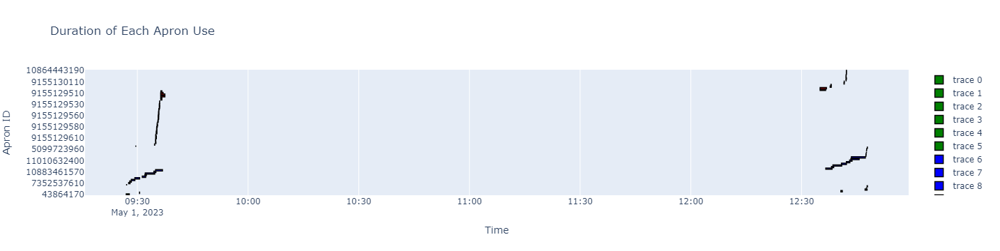

In [71]:
import plotly.graph_objects as go
import pandas as pd
from datetime import datetime


# Convert entry and exit times to datetime
df['entry_time'] = pd.to_datetime(df['entry_time'])
df['exit_time'] = pd.to_datetime(df['exit_time'])

# Initialize the figure
fig = go.Figure()

# Mapping for aeroway fill colors
aeroway_colors = {
    'runway': 'green',
    'taxiway': 'blue',
    'parking_position':'red'
}

# Adding bars for each apron usage
for i, row in df.iterrows():
    duration = (row['exit_time'] - row['entry_time']).total_seconds()*1000
    fig.add_trace(go.Bar(
        x=[duration],
        y=[str(row['apron_id']) + str(row['track_id'])],
        base=row['entry_time'],
        orientation='h',
        marker=dict(
            color=aeroway_colors.get(row['apron_aeroway'], 'gray'),  # Fill color based on aeroway
            line=dict(
                color='black',  # Outline color
                width=1.5
            )
        ),
        hoverinfo='text',
        hovertext=f"Apron ID Link: {row['apron_id_link']}<br>" +
                  f"Apron Ref: {row['apron_ref']}<br>" +
                  f"Time in Use: {row['time_in_use_seconds']} seconds"
    ))

# Update layout
fig.update_layout(
    title="Duration of Each Apron Use",
    xaxis_title="Time",
    xaxis=dict(type='date'),
    yaxis_title="Apron ID"
)

fig.show()


In [ ]:
4386419 1104890051

Rules: 

- If one taxiway or runway period is completely within another taxiway or runway period: then the overlapping taxiway period is valid only.
- If one parking_position period is completely within another taxiway period: then the overlapping taxiway period is valid only, EXCEPT, when the taxiway period and runway period end or start at the same time.  

In [58]:
from HexAeroPy import h3maps
apron = pd.read_parquet(f'data/apron_hex/h3_res_12_apron_{apt}.parquet')
df_essa['icaocall'] = df_essa['icao24'] + '_' +df_essa['callsign']
df_essa = df_essa[df_essa['icaocall'] == 'ab6ebe_RDN993']
apron['is_detected'] = apron.hex_id.isin(df_essa.h3_12.to_list())

In [60]:
apron['is_detected'] = apron['is_detected'].astype(int)*5000

In [ ]:
apron['is_detected'] = apron['is_detected'].replace(0, None)

In [ ]:
dic = {'runway':1000, 'taxiway':2000, 'parking_position':3000}
apron['aeroway_map'] = apron['aeroway'].apply(lambda l: dic[l])

apron['is_detected'] = apron['is_detected'].fillna(apron['aeroway_map'])

/tmp/ipykernel_195/1929336610.py:4: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
apron

,apt_icao,hex_id,hex_latitude,hex_longitude,hex_res,aeroway,ele,length,ref,surface,width,id,type,runway,note,avg_heading,color_type,alt_name,is_detected,aeroway_map
0,LSZH,8c1f8eda09163ff,47.463512,8.560640,12,runway,427,3300,14/32,asphalt,60.0,4386417,way,None,None,324.072092,1,None,1000,1000
0,LSZH,8c1f8eda400a7ff,47.470310,8.551283,12,runway,427,3300,14/32,asphalt,60.0,4386417,way,None,None,324.072092,1,None,1000,1000
0,LSZH,8c1f8eda489d1ff,47.475101,8.545310,12,runway,427,3300,14/32,asphalt,60.0,4386417,way,None,None,324.072092,1,None,1000,1000
0,LSZH,8c1f8eda40c87ff,47.468361,8.554187,12,runway,427,3300,14/32,asphalt,60.0,4386417,way,None,None,324.072092,1,None,1000,1000
0,LSZH,8c1f8eda42967ff,47.465740,8.557842,12,runway,427,3300,14/32,asphalt,60.0,4386417,way,None,None,324.072092,1,None,1000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,LSZH,8c1f8eda0071bff,47.455463,8.571911,12,parking_position,None,None,SD,None,NaN,1091229749,way,None,None,209.912169,10000,None,3000,3000
248,LSZH,8c1f8eda0a823ff,47.457466,8.574685,12,parking_position,None,None,409,None,NaN,1126642519,way,None,None,268.587037,10000,None,3000,3000
248,LSZH,8c1f8eda0a827ff,47.457341,8.574511,12,parking_position,None,None,409,None,NaN,1126642519,way,None,None,268.587037,10000,None,3000,3000
248,LSZH,8c1f8eda0a9c9ff,47.457312,8.574752,12,parking_position,None,None,409,None,NaN,1126642519,way,None,None,268.587037,10000,None,3000,3000


In [ ]:
fig = h3maps.choropleth_map(apron, column_name="is_detected", border_color='black', fill_opacity=0.7, color_map_name="Reds", initial_map=None, initial_location=[54.641594, 25.290858], initial_zoom=15, tooltip_columns=['aeroway', 'ref', 'id'])

import folium

def add_trajectory(map_object, dataframe):
    """
    Adds an aircraft trajectory to a Folium map based on coordinates in a Pandas DataFrame.
    This includes drawing a polyline for the trajectory and individual markers for each point,
    with a tooltip displaying the 'time'.

    Parameters:
    - map_object: Folium Map instance where the trajectory will be added.
    - dataframe: Pandas DataFrame containing the trajectory coordinates with columns 'lat', 'lon',
                 and 'time' for the tooltip.
    """
    # Extracting coordinates and times from DataFrame
    coordinates = dataframe[['lat', 'lon']].values.tolist()
    times = dataframe['time'].tolist()

    # Adding a PolyLine to the map to represent the trajectory
    folium.PolyLine(coordinates, color="blue", weight=2.5, opacity=1).add_to(map_object)

    # Adding markers for each point with a tooltip displaying the time
    for (lat, lon), time in zip(coordinates, times):
        folium.CircleMarker(
            [lat, lon],
            radius=3, # Size of the dot
            color="red",
            fill=True,
            fill_color="red",
            fill_opacity=1,
            tooltip=f'Time: {time}'
        ).add_to(map_object)


add_trajectory(fig, df_essa)

fig

Colour column min value 1000, max value 5000, mean value 2020.4317975018612
Hexagon cell count: 8357


In [83]:
fig.save('flight_3c675a_DLH886.html')

In [ ]:
df_essa_apron

In [ ]:
df_essa_apron

In [ ]:
df_essa_apron.groupby(['icao24', 'callsign', 'apron_id', 'apron_aeroway', 'apron_name'])['time'].agg(['min', 'max'])


In [71]:
import 

SyntaxError: invalid syntax (2494350585.py, line 1)

In [72]:
logging.warning("test")

NameError: name 'logging' is not defined

In [73]:
import h3pandas
h3pandas.__version__

'0.2.6'

In [74]:
import pandas as pd
min([5 , 10])

5

In [14]:
min?

Docstring:
min(iterable, *[, default=obj, key=func]) -> value
min(arg1, arg2, *args, *[, key=func]) -> value

With a single iterable argument, return its smallest item. The
default keyword-only argument specifies an object to return if
the provided iterable is empty.
With two or more arguments, return the smallest argument.
Type:      builtin_function_or_method


In [5]:
print("test")

test


In [ ]:
apron = apron[['hex_id', 'aeroway', 'id', 'ref']]
apron.columns = ['apron_' + x for x in apron.columns]
#apron['apron_name'] = apron['apron_name'].fillna('')
apron['apron_ref'] = apron['apron_ref'].fillna('')

# Add link to the element in question
apron['apron_id_link'] = 'https://www.openstreetmap.org/way/' + apron['apron_id'].astype(str).fillna('')

# Add apron info
df_essa_apron = df_essa.merge(apron, left_on = 'h3_12', right_on='apron_hex_id')

# Assuming df_essa_apron is your original DataFrame
# Step 1: Separate the different types of apron_aeroway
runway_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'runway']
taxiway_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'taxiway']
parking_position_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'parking_position']

# Step 2: Identify 'runway' and 'taxiway' entries to keep (without duplicates)
# Sort by 'apron_aeroway' to prioritize 'runway' over 'taxiway' and then drop duplicates
priority_df = pd.concat([runway_df, taxiway_df], ignore_index=True)
priority_df['sort_key'] = priority_df['apron_aeroway'].replace({'runway': 0, 'taxiway': 1})
priority_df.sort_values(by=['icao24', 'callsign', 'time', 'sort_key'], inplace=True)
priority_df.drop_duplicates(subset=['icao24', 'callsign', 'time'], keep='first', inplace=True)
priority_df.drop('sort_key', axis=1, inplace=True)

# Step 3: Exclude 'parking_position' entries if they have the same timestamp, icao24, and callsign as any 'runway'/'taxiway' entry
# Note that 'parking_position' entries are only compared within their own group
#mask = parking_position_df[['icao24', 'callsign', 'time']].isin(priority_df[['icao24', 'callsign', 'time']].to_dict('list')).all(axis=1)
#filtered_parking_position_df = parking_position_df[~mask]

# Step 4: Concatenate all parts back together
df_essa_apron_final = pd.concat([priority_df, parking_position_df], ignore_index=True)
df_essa_apron_final = df_essa_apron
# The final_df now contains:
# - 'runway' entries preferred over 'taxiway' when both have the same timestamp, icao24, and callsign
# - 'parking_position' entries that don't have a conflicting timestamp, icao24, and callsign with 'runway' or 'taxiway'
# - Duplicates within 'parking_position' are kept if they have different ids


# Now df_essa_apron_final contains your desired result.

# Ensure the DataFrame is sorted
df_essa_apron_final.sort_values(by=['id', 'time'], inplace=True)

# Convert time column to datetime if it's not already
df_essa_apron_final['time'] = pd.to_datetime(df_essa_apron_final['time'])

# Function to assign track IDs within each group
def assign_track_ids(group):
    # Sort group just in case
    group = group.sort_values(by='time')
    
    # Calculate the time difference between each row and the next
    group['time_diff'] = group['time'].diff().dt.total_seconds().fillna(0)
    
    # Identify rows where a new track starts
    group['new_track'] = (group['time_diff'] > (30 * 60)) # Assuming a new track if the gap is more than 30 minutes
    
    # Cumulative sum to assign a new ID each time 'new_track' is True
    group['track_id'] = group['new_track'].cumsum()
    
    return group

# Apply the function to each group of 'id' and 'apron_id'
df_essa_apron_final = df_essa_apron_final.groupby(['id', 'apron_id']).apply(assign_track_ids)

# Optional: drop the intermediate columns if they are no longer needed
df_essa_apron_final.drop(columns=['time_diff', 'new_track'], inplace=True)


# Groupby
df_essa_apron = df_essa_apron_final.groupby(['icao24', 'callsign', 'apron_id', 'apron_id_link', 'apron_aeroway','apron_ref'])['time'].agg(["min", "max"]).reset_index()

# Add time in use for each element
df_essa_apron['time_in_use'] = df_essa_apron['max'] - df_essa_apron['min']
df_essa_apron['time_in_use_seconds'] = df_essa_apron['time_in_use'].dt.total_seconds()

# Sort in time
df_essa_apron = df_essa_apron.sort_values(['icao24', 'callsign', 'min'])

# Rename
df_essa_apron = df_essa_apron.rename({'min':'entry_time', 'max':'exit_time'},axis=1)

# Make str
df_essa_apron['entry_time'] = df_essa_apron['entry_time'].apply(str)
df_essa_apron['exit_time'] = df_essa_apron['exit_time'].apply(str)

df_essa_apron = df_essa_apron[['icao24', 'callsign','apron_id', 'apron_id_link', 'apron_aeroway', 'apron_ref', 'entry_time', 'exit_time', 'time_in_use_seconds']]

df_essa_apron.to_excel(f'apron_test_{apt}_2024-01-01.xlsx', index=False)